## Setup the environment

In [1]:
import matplotlib
import gc
import numpy as np
import pandas as pd
import pyarrow.parquet as pq
import random
import sklearn
import lightgbm
import matplotlib.pyplot as plt
import seaborn as sns
import re
import joblib
import lightgbm as lgb
import math

In [2]:
from collections import Counter
from numerapi import NumerAPI
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ARDRegression
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from utils import save_model, load_model, neutralize, get_biggest_change_features, validation_metrics
from sklearn import (
    feature_extraction, feature_selection, decomposition, linear_model,
    model_selection, metrics, svm
)
from utils import (
    save_model, load_model, neutralize,
    get_biggest_change_features,
    get_time_series_cross_val_splits,
    validation_metrics,
    ERA_COL, DATA_TYPE_COL, TARGET_COL, EXAMPLE_PREDS_COL
)
%matplotlib inline

# Downlaod the dataset via Numerai.api

In [3]:
napi = NumerAPI()
print("Downloading dataset files...")
dataset_name = "v4"
current_round = napi.get_current_round()
# napi.download_dataset("{dataset_name}/train.parquet", "train.parquet")
# napi.download_dataset("{dataset_name}/validation.parquet", "validation.parquet")
# napi.download_dataset("{dataset_name}/live.parquet", "live.parquet")
# napi.download_dataset("{dataset_name}/live_example_preds.parquet", "live_example_preds.parquet")
# napi.download_dataset("{dataset_name}/validation_example_preds.parquet", "validation_example_preds.parquet")

# Some functions for later usages

In [3]:
def prediction_clip(read_file, save_name):
    read = pd.read_csv(read_file)
    read.loc[read['prediction'] < 0, 'prediction'] = 0
    read.loc[read['prediction'] > 1, 'prediction'] = 1
    read.to_csv(read_file, index=False)

#input np.array of the prediction from the model
def valid_gen_and_save(prediction,version_name):
    id = df_validation.index
    data = {'id': id, 'prediction': np.round(prediction, 8)}
    pred_file = pd.DataFrame(data)
    current_round = 433
    file_name = f"./prediction/val_{current_round}_{version_name}.csv"
    pred_file.to_csv(file_name, index=False)
    prediction_clip(file_name, file_name)


## Feature analysis

read the files

In [5]:
df_train = pd.read_parquet('./v4/train.parquet')
# df_validation = pd.read_parquet('./v4/validation.parquet')
# df_live = pd.read_parquet('./v4/live.parquet')
df_train.info()
# df_validation.info()
# df_live.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2420521 entries, n003bba8a98662e4 to nfff2bd38e397265
Columns: 1222 entries, era to target_thomas_v4_60
dtypes: float32(1220), object(2)
memory usage: 11.1+ GB


In [9]:
# features = [c for c in df_validation if c.startswith("feature")]
# targets = [c for c in df_validation if c.startswith("target")]
# targets_60 = [c for c in df_validation if (c.startswith("target") and c.endswith("60"))]
# eras_features_and_targets = [c for c in df_validation if (c.startswith("target") or c.startswith("feature") or c.startswith("era"))]
# feature_size = len(features)
# target_size = len(targets)
# eras_features_and_targets_size = len(eras_features_and_targets)

# print("The size of the feature is:", feature_size)
# print("The size of the targets is:", target_size)
# print("The size of eras + features + targets =", eras_features_and_targets_size)

The size of the feature is: 1191
The size of the targets is: 29
The size of eras + features + targets = 1221


In [ ]:
features = [c for c in df_train if c.startswith("feature")]
targets = [c for c in df_train if c.startswith("target")]
targets_60 = [c for c in df_train if (c.startswith("target") and c.endswith("60"))]
eras_features_and_targets = [c for c in df_train if (c.startswith("target") or c.startswith("feature") or c.startswith("era"))]
feature_size = len(features)
target_size = len(targets)
eras_features_and_targets_size = len(eras_features_and_targets)

print("The size of the feature is:", feature_size)
print("The size of the targets is:", target_size)
print("The size of eras + features + targets =", eras_features_and_targets_size)

On every Tuesday, Wednesday, Thursday, Friday, and Saturday of the week, a new round is open and new tournament data is released. To participate in the round you need to download the latest tournament data, generate new predictions, and upload those predictions back to Numerai. Here's the overview of the weekly data.

In [6]:
df_live

,era,data_type,feature_honoured_observational_balaamite,feature_polaroid_vadose_quinze,feature_untidy_withdrawn_bargeman,feature_genuine_kyphotic_trehala,feature_unenthralled_sportful_schoolhouse,feature_divulsive_explanatory_ideologue,feature_ichthyotic_roofed_yeshiva,feature_waggly_outlandish_carbonisation,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
id,,,,,,,,,,,,,,,,,,,,,
n0008fd84e8f1032,X,live,0.50,1.00,1.00,0.50,0.25,1.00,1.00,0.50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n0010abfba557aa2,X,live,0.75,1.00,0.25,0.75,0.00,1.00,0.50,0.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n002cddf421562d2,X,live,0.75,0.00,0.25,0.25,0.75,1.00,0.00,0.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n0031e856de65911,X,live,1.00,0.00,0.75,0.00,1.00,0.00,0.00,1.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
n003ad8c053bbb60,X,live,0.75,0.00,0.25,0.00,1.00,0.00,0.00,0.75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nffb36f641f441ee,X,live,0.50,0.25,1.00,0.00,0.25,0.25,0.50,0.75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nffb6b5eaa75f17c,X,live,1.00,0.25,1.00,0.00,0.00,0.00,1.00,1.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
nffcf7d63afe24e0,X,live,0.50,0.00,0.00,0.25,1.00,0.00,0.25,1.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


First three rows of the training dataset

In [ ]:
df_train.head(3)

,era,data_type,feature_honoured_observational_balaamite,feature_polaroid_vadose_quinze,feature_untidy_withdrawn_bargeman,feature_genuine_kyphotic_trehala,feature_unenthralled_sportful_schoolhouse,feature_divulsive_explanatory_ideologue,feature_ichthyotic_roofed_yeshiva,feature_waggly_outlandish_carbonisation,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
id,,,,,,,,,,,,,,,,,,,,,
n003bba8a98662e4,0001,train,1.0,0.50,1.00,1.00,0.00,0.00,1.00,1.00,...,0.50,0.25,0.25,0.00,0.333333,0.000000,0.500000,0.500000,0.166667,0.000000
n003bee128c2fcfc,0001,train,0.5,1.00,0.25,0.75,0.00,0.75,0.50,0.75,...,0.75,1.00,1.00,1.00,0.666667,0.666667,0.833333,0.666667,0.833333,0.666667
n0048ac83aff7194,0001,train,0.5,0.25,0.75,0.00,0.75,0.00,0.75,0.75,...,0.50,0.25,0.25,0.25,0.500000,0.333333,0.333333,0.500000,0.500000,0.333333


tail of the training dataset. There are 574 eras(weeks) in totals

In [ ]:
df_train.tail(3)

,era,data_type,feature_honoured_observational_balaamite,feature_polaroid_vadose_quinze,feature_untidy_withdrawn_bargeman,feature_genuine_kyphotic_trehala,feature_unenthralled_sportful_schoolhouse,feature_divulsive_explanatory_ideologue,feature_ichthyotic_roofed_yeshiva,feature_waggly_outlandish_carbonisation,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
id,,,,,,,,,,,,,,,,,,,,,
nffde3b371d67394,0574,train,0.25,0.25,0.50,0.25,0.75,0.75,0.75,0.25,...,0.25,0.50,0.50,0.50,0.333333,0.666667,0.500000,0.666667,0.333333,0.666667
nfff1a1111b35e84,0574,train,1.00,0.75,0.50,0.50,0.75,0.50,0.25,0.50,...,0.75,0.75,0.75,0.75,0.500000,0.666667,0.500000,0.500000,0.500000,0.500000
nfff2bd38e397265,0574,train,0.25,0.25,0.75,0.00,0.50,0.50,1.00,1.00,...,0.50,0.75,0.50,0.75,0.833333,0.833333,0.666667,0.833333,0.833333,1.000000


An overview of the features in training data. We notice that many values of the features are missing.

In [ ]:
df_train[features].head(5)

,feature_honoured_observational_balaamite,feature_polaroid_vadose_quinze,feature_untidy_withdrawn_bargeman,feature_genuine_kyphotic_trehala,feature_unenthralled_sportful_schoolhouse,feature_divulsive_explanatory_ideologue,feature_ichthyotic_roofed_yeshiva,feature_waggly_outlandish_carbonisation,feature_floriated_amish_sprite,feature_iconoclastic_parietal_agonist,...,feature_aged_phylacterical_pusey,feature_revisional_ablutionary_depression,feature_yokelish_metapsychological_lunt,feature_circumlunar_chaliced_seam,feature_squallier_prototypal_dammar,feature_cognate_elating_ravine,feature_ethiopian_carminative_retentivity,feature_alabamian_outlying_monitoring,feature_byzantine_festinate_mannose,feature_sleetier_sea_potamogeton
id,,,,,,,,,,,,,,,,,,,,,
n003bba8a98662e4,4,2,4,4,0,0,4,4,3,0,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
n003bee128c2fcfc,2,4,1,3,0,3,2,3,2,2,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
n0048ac83aff7194,2,1,3,0,3,0,3,3,4,2,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
n00691bec80d3e02,4,2,2,3,0,4,1,4,1,3,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
n00b8720a2fdc4f2,4,3,4,4,0,0,4,2,3,0,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>


As we can see, all the values for each features have been normalized. We can't know much from the distribution of the data

In [13]:
df_train[features].describe()

,feature_honoured_observational_balaamite,feature_polaroid_vadose_quinze,feature_untidy_withdrawn_bargeman,feature_genuine_kyphotic_trehala,feature_unenthralled_sportful_schoolhouse,feature_divulsive_explanatory_ideologue,feature_ichthyotic_roofed_yeshiva,feature_waggly_outlandish_carbonisation,feature_floriated_amish_sprite,feature_iconoclastic_parietal_agonist,...,feature_circumspective_daughterly_brubeck,feature_mimetic_sprawly_flue,feature_inductile_umbrian_wallah,feature_ineloquent_bihari_brougham,feature_shakespearean_alpha_constituent,feature_marxian_plated_refrigeration,feature_amative_irresponsive_flattie,feature_intermissive_coronal_reinsertion,feature_dwarfish_isochronal_amateur,feature_polyphyletic_unplumed_pandiculation
count,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,...,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06
mean,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,...,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01,4.999783e-01
std,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,...,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01,3.535955e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,...,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01,2.500000e-01
50%,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,...,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01
75%,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,...,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01,7.500000e-01
max,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


## Targets (the values of prediction)

There are 10 different types of targets constructed and 2 versions of each constructed with a 20 day window or a 60 day window. The tournament ask us to predict 'target' which currently corresponds to 'target_nomi_20'

The other auxillary targets can be very useful for advanced training. But, for the sake of time, we'll just focus on the 'target'

In [8]:
df_train[targets].head(5)

,target,target_nomi_v4_20,target_nomi_v4_60,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
id,,,,,,,,,,,,,,,,,,,,,
n003bba8a98662e4,0.25,0.25,0.00,0.50,0.25,0.25,0.00,0.25,0.25,0.50,...,0.50,0.25,0.25,0.00,0.333333,0.000000,0.500000,0.500000,0.166667,0.000000
n003bee128c2fcfc,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75,...,0.75,1.00,1.00,1.00,0.666667,0.666667,0.833333,0.666667,0.833333,0.666667
n0048ac83aff7194,0.50,0.50,0.25,0.50,0.50,0.50,0.25,0.50,0.25,0.50,...,0.50,0.25,0.25,0.25,0.500000,0.333333,0.333333,0.500000,0.500000,0.333333
n00691bec80d3e02,0.75,0.75,0.50,0.50,0.75,0.75,0.50,0.75,0.50,0.50,...,0.50,0.50,0.50,0.50,0.666667,0.500000,0.500000,0.500000,0.666667,0.500000
n00b8720a2fdc4f2,0.75,0.75,0.50,0.75,0.75,0.75,0.50,0.50,0.50,0.50,...,0.50,0.50,0.50,0.50,0.666667,0.500000,0.666667,0.500000,0.666667,0.500000


In [11]:
targets_corr.describe()

,target,target_nomi_v4_20,target_nomi_v4_60,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
count,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,...,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000,29.000000
mean,0.639413,0.639413,0.620985,0.553498,0.542222,0.637007,0.621284,0.624270,0.609530,0.620273,...,0.611188,0.590684,0.564374,0.543566,0.641608,0.625319,0.566881,0.550083,0.630111,0.612867
std,0.208030,0.208030,0.195473,0.180271,0.175832,0.204424,0.195010,0.198569,0.191899,0.195170,...,0.192087,0.188415,0.179054,0.176008,0.196002,0.191125,0.180131,0.178792,0.195924,0.189869
min,0.383552,0.383552,0.383144,0.332891,0.332948,0.389487,0.388008,0.374538,0.374793,0.373142,...,0.358383,0.352221,0.335528,0.329149,0.381267,0.378650,0.333293,0.335528,0.380781,0.380438
25%,0.454295,0.454295,0.454590,0.399233,0.399665,0.450196,0.452137,0.445551,0.447467,0.445910,...,0.436151,0.428179,0.408407,0.401362,0.474758,0.475722,0.404631,0.398748,0.444664,0.441579
50%,0.679708,0.679708,0.500773,0.597282,0.421980,0.691680,0.498801,0.667864,0.491720,0.666373,...,0.636716,0.499098,0.581884,0.482488,0.678452,0.527408,0.599753,0.482284,0.679242,0.519848
75%,0.819984,0.819984,0.792348,0.718793,0.708798,0.811275,0.791844,0.805241,0.775015,0.818309,...,0.780026,0.759599,0.723801,0.704269,0.848545,0.817940,0.716456,0.702742,0.791267,0.767228
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Note that almost all 60-days targets have low correlation with target_nomi_v4_20. We will use this info to make our model more generalizable.

In [ ]:
df_train[targets].describe()

,target,target_nomi_v4_20,target_nomi_v4_60,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
count,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,2.420521e+06,...,2.409951e+06,2.391506e+06,2.411771e+06,2.395519e+06,2.409951e+06,2.391506e+06,2.409951e+06,2.391506e+06,2.411771e+06,2.395519e+06
mean,5.000010e-01,5.000010e-01,4.999982e-01,4.999407e-01,4.999407e-01,5.000024e-01,4.999810e-01,5.000186e-01,4.999880e-01,5.000199e-01,...,4.995543e-01,4.991860e-01,4.987555e-01,4.985601e-01,5.047721e-01,5.057657e-01,5.003674e-01,5.007439e-01,4.998152e-01,4.998610e-01
std,2.236147e-01,2.236147e-01,2.236051e-01,2.237062e-01,2.237062e-01,2.236177e-01,2.235994e-01,2.233297e-01,2.232968e-01,2.230720e-01,...,2.230960e-01,2.228404e-01,2.221958e-01,2.221896e-01,1.993793e-01,1.972146e-01,1.712154e-01,1.682939e-01,1.805823e-01,1.782331e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.500000e-01,2.500000e-01,5.000000e-01,2.500000e-01,2.500000e-01,5.000000e-01,2.500000e-01,5.000000e-01,5.000000e-01,2.500000e-01,...,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,3.333333e-01,3.333333e-01,3.333333e-01,3.333333e-01,3.333333e-01,3.333333e-01
50%,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,...,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01
75%,7.500000e-01,7.500000e-01,5.000000e-01,7.500000e-01,7.500000e-01,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,7.500000e-01,...,5.000000e-01,5.000000e-01,5.000000e-01,5.000000e-01,6.666667e-01,6.666667e-01,5.000000e-01,5.000000e-01,6.666667e-01,6.666667e-01
max,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


------

# The data is temporal
It's importat to note that the amount of data change over time. The "era" stands for the unit of week (five days). There are 574 weeks (10 years) in total. Some of the data were not available before, so the count of each feature fluctuate over time. In average, there are 4217 ovservations in each era.

,Observations
count,574.00000
mean,4216.93554
std,582.60161
min,2072.00000
25%,3944.75000
50%,4408.00000
75%,4635.00000
max,4917.00000


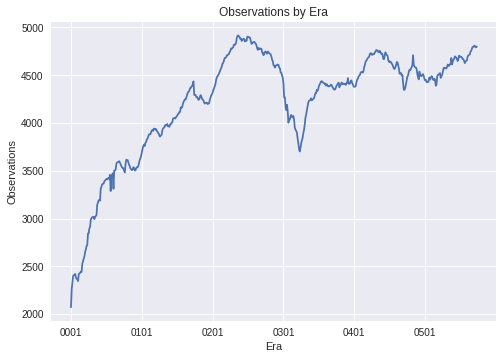

In [ ]:
plt.style.use('seaborn')
eraCount = Counter()
for era in df_train['era']:
    eraCount[era] += 1
eraCount = pd.DataFrame.from_dict(eraCount, orient='index', columns=['Observations'])
eraCount.plot(legend=None)
plt.xlabel('Era')
plt.ylabel('Observations')
plt.title('Observations by Era')
eraCount.describe()

Also, eras are “overlapping” by 4. This means that nearby eras are correlated with one another because their targets are generated from stock market performance from a shared, or “overlapping”, period of time. To match the scale of **target 20 (month)**, we need to average the rows **by four** in the same era. Similarly, to match the scale of  **target 60 (season)**, we need to average the data **by 12**.

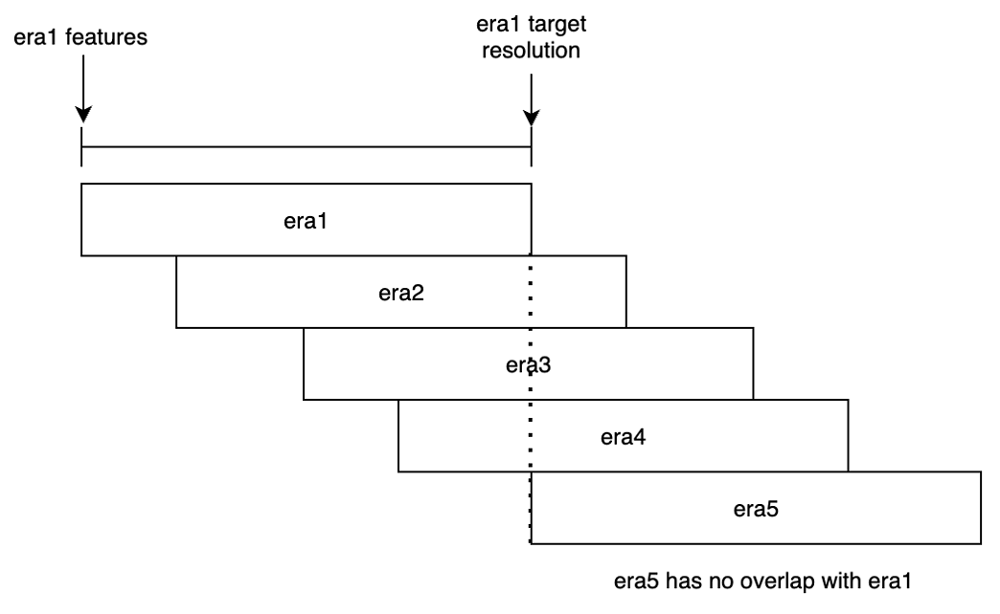

## The study of the correlation
The correlation matrix is massive!!! 
To save time, I save the correlation matrix to a csv file so we can load it when we start a new runtime. I also put the csv file in google sheet for readibility:

Corr Matrix of eras, features, targets:

https://docs.google.com/spreadsheets/d/1Q_0th8SIlKZ7NNjaQDhTvD2a2y3tvDP-G1U0cDzXfI4/edit?usp=sharing

Corr Matrix of features only:

https://docs.google.com/spreadsheets/d/1dnWiFqw1YYa3rStfIVfN0BnSkAuLZHJQ_0alp7P0YSc/edit?usp=sharing

the correlation between eras, features, targets

In [8]:
feature_corrs_all = df_train[eras_features_and_targets].corr()
# feature_corrs_all.to_csv('./corr/correlation_matrix_all_no_index.csv', index=False)
# feature_corrs_all.to_csv('./corr/correlation_matrix_all.csv', index=True)
# feature_corrs_all = pd.read_csv("./corr/correlation_matrix_all_no_index.csv")

In [8]:
feature_corrs_all.head()

,era,feature_honoured_observational_balaamite,feature_polaroid_vadose_quinze,feature_untidy_withdrawn_bargeman,feature_genuine_kyphotic_trehala,feature_unenthralled_sportful_schoolhouse,feature_divulsive_explanatory_ideologue,feature_ichthyotic_roofed_yeshiva,feature_waggly_outlandish_carbonisation,feature_floriated_amish_sprite,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
0,1.000000,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,...,0.000346,0.000379,0.001267,0.000278,-0.002671,-0.003811,0.000076,0.000226,-0.000590,-0.001091
1,0.000004,1.000000,0.038110,0.131728,0.226915,-0.225173,0.027056,0.067222,0.194785,-0.066792,...,-0.015117,-0.028908,-0.002144,-0.006674,-0.006121,-0.011200,0.000594,0.000677,0.004689,0.009423
2,0.000004,0.038110,1.000000,-0.048521,0.286904,-0.217751,0.182376,0.051035,-0.003776,0.071768,...,0.039055,0.051082,0.028036,0.045389,-0.001687,-0.004957,-0.001244,-0.002491,0.004445,0.007826
3,0.000004,0.131728,-0.048521,1.000000,-0.075456,-0.091974,0.094276,0.203711,0.143852,-0.037428,...,-0.016374,-0.027065,0.001497,-0.001449,-0.006231,-0.009279,-0.000074,0.000023,0.005783,0.011775
4,0.000004,0.226915,0.286904,-0.075456,1.000000,-0.070931,0.072945,0.082345,-0.143627,0.035555,...,0.016083,0.010817,0.026546,0.038245,-0.007030,-0.017638,-0.001277,-0.001895,0.012125,0.018851


we can see that features have multiple weird diagnal lines. This is because of the over-lapping time frame. Thus, use all the features for training might very likely to be over-fitting. I also notice the obvious noise in patterns, which means that if we using all the data training, the model might very likely to be over-fitting.

In [10]:
plt.figure(figsize=(100, 100))
ax = sns.heatmap(feature_corrs_all, cmap="coolwarm")
ax.set_title("Correlation matrix all")
plt.show()

### Correlation of single feature doesn't work consistently

let's look at the corr between features and the target in era 1

In [22]:
feature_era1_corrs = df_train[df_train.era=='0001'][features].corr()

In [24]:
feature_era1_corrs.stack()

feature_honoured_observational_balaamite     feature_honoured_observational_balaamite       1.000000
                                             feature_polaroid_vadose_quinze                 0.002170
                                             feature_untidy_withdrawn_bargeman              0.141514
                                             feature_genuine_kyphotic_trehala               0.171890
                                             feature_unenthralled_sportful_schoolhouse     -0.149952
                                                                                              ...   
feature_polyphyletic_unplumed_pandiculation  feature_marxian_plated_refrigeration           0.945034
                                             feature_amative_irresponsive_flattie           0.951543
                                             feature_intermissive_coronal_reinsertion       0.896336
                                             feature_dwarfish_isochronal_amateur           

### Correlation between top1 positive feature and target by era

A more effective approach would be to train the machine learning model using features that exhibit a positive correlation with the target variable within a specific time frame. This necessitates the use of a dynamic correlation matrix for each window when implementing a training of time-seires dataset, which I will implement below.

Text(0.5, 1.0, 'Correlation of the top positive feature by era')

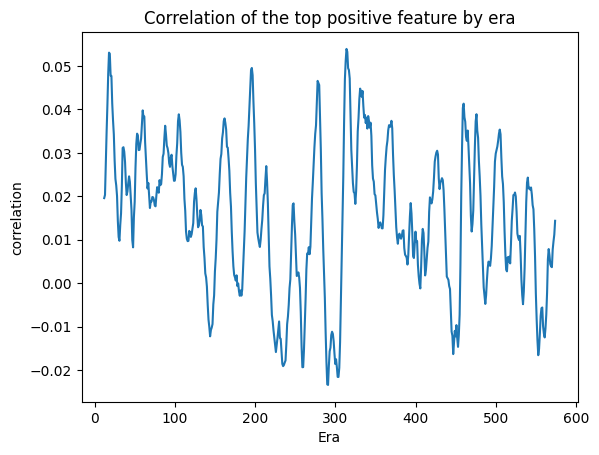

In [15]:
df_train["erano"] = df_train.era.astype(int)
by_era_correlation = pd.Series({
    era: np.corrcoef(tdf["target"], tdf["feature_fourieristic_allied_mugwumpery"])[0,1]
    for era, tdf in df_train.groupby(df_train.erano)
})
by_era_correlation.rolling(12).mean().plot()
plt.xlabel('Era')
plt.ylabel('correlation')
plt.title('Correlation of the top positive feature by era')

### These are all the features that have positive correlation with the 'target' Sorted by value

In [6]:
# corr_matrix_all = df_train[eras_features_and_targets].corr()
# corr_matrix_all.to_csv("./corr/corr_matrix_all_v2.csv", index=True)
# corr_matrix_all.to_csv("./corr/corr_matrix_all_v2_no_index.csv", index=False)

# corr_matrix_all = pd.read_csv("./corr/correlation_matrix_all.csv")
corr_matrix_all = pd.read_csv("./corr/corr_matrix_all_v2.csv")


Get all the features that have positive corr with target. As we can see, there are 667 of 1191 related features.

In [7]:
new_corr_matrix_all = corr_matrix_all.rename(columns={'Unnamed: 0': 'features'})
df_corr_target = new_corr_matrix_all[['features', 'target']]
# filtered_df_positive = corr_matrix_all[corr_matrix_all['target'] > 0]
filtered_df_positive = df_corr_target[df_corr_target['target'] > 0]
filtered_df_positive = filtered_df_positive[filtered_df_positive['features'].str.startswith('feature') ]
# filtered_df_features = filtered_df_positive[['target']]
# filtered_df_positive.describe()
pos_feat = filtered_df_positive.sort_values(by='target', ascending=False)

In [27]:
filtered_df_positive

,features,target
0,feature_honoured_observational_balaamite,0.000172
1,feature_polaroid_vadose_quinze,0.000141
3,feature_genuine_kyphotic_trehala,0.000526
8,feature_floriated_amish_sprite,0.000513
10,feature_demolished_unfrightened_superpower,0.000043
...,...,...
1146,feature_bifocal_disposable_clacton,0.011003
1147,feature_splashier_conservant_ultramarine,0.012549
1148,feature_fourieristic_allied_mugwumpery,0.014195
1149,feature_headiest_unguessed_religion,0.010492


The summary of the positive correlated features indicates that, in these 667 features, the mean of the correlation is 0.4% and the correlation value of top 25% features is about 0.6%

In [14]:
filtered_df_positive.describe()

,target
count,667.000000
mean,0.003941
std,0.003151
min,0.000014
25%,0.001388
50%,0.002942
75%,0.006067
max,0.014195


In [32]:
count_pos_feat = 0
for i in filtered_df_positive['target']:
    if i > 0.006:
        count_pos_feat +=1
print(f"num of positive features that is greater than 0.006 = {count_pos_feat}")

num of positive features that is greater than 0.006 = 170


From the correlation of the positive features by feature index (era), we can observe 5 peaks. Each of them is a normal distribution regarded as a smale cycle. I think this explains why the repetitive pattern in the correlation matrix.

Text(0.5, 1.0, 'features of postive correlation with target')

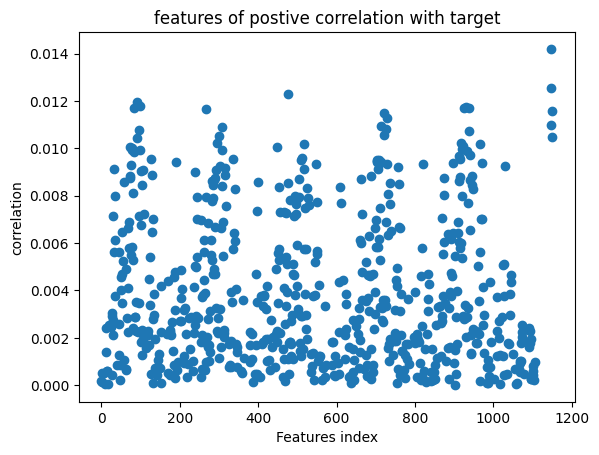

In [20]:
plt.plot(pos_feat.index, pos_feat['target'],'o')
plt.xlabel('Features index')
plt.ylabel('correlation')
plt.title('features of postive correlation with target')

To this point, we only focus on the 20-days overall target which corresponds to 'target_nomi_v4_20'. However, the model needs long-term targets as the feedback to prevent it from overfitting. So, below is an overview of the 60-days targets.

In [33]:
df_train[targets_60]

,target_nomi_v4_60,target_tyler_v4_60,target_victor_v4_60,target_ralph_v4_60,target_waldo_v4_60,target_jerome_v4_60,target_janet_v4_60,target_ben_v4_60,target_alan_v4_60,target_paul_v4_60,target_george_v4_60,target_william_v4_60,target_arthur_v4_60,target_thomas_v4_60
id,,,,,,,,,,,,,,
n003bba8a98662e4,0.00,0.25,0.00,0.25,0.25,0.25,0.50,0.25,0.25,0.25,0.00,0.000000,0.500000,0.000000
n003bee128c2fcfc,0.75,0.75,0.75,0.75,1.00,1.00,0.50,1.00,0.50,1.00,1.00,0.666667,0.666667,0.666667
n0048ac83aff7194,0.25,0.50,0.25,0.25,0.25,0.25,0.50,0.25,0.50,0.25,0.25,0.333333,0.500000,0.333333
n00691bec80d3e02,0.50,0.75,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.500000,0.500000,0.500000
n00b8720a2fdc4f2,0.50,0.75,0.50,0.50,0.50,0.50,0.50,0.50,0.25,0.50,0.50,0.500000,0.500000,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nffcc1dbdf2212e6,1.00,0.75,1.00,1.00,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.833333,0.833333,0.833333
nffd71b7f6a128df,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.50,0.25,0.50,0.50,0.500000,0.333333,0.333333
nffde3b371d67394,0.50,0.50,0.50,0.75,0.50,0.50,0.75,0.50,0.75,0.50,0.50,0.666667,0.666667,0.666667


According to the correlation matrix, the 20-day targets exhibit strong correlation among themselves, but exhibit weak correlation with the 60-day targets. Conversely, the 60-day targets display weak correlation with the 20-day targets but exhibit strong correlation among themselves. In other words, incorporating 60-day targets can aid in fine-tuning the model and prevent over-fitting.

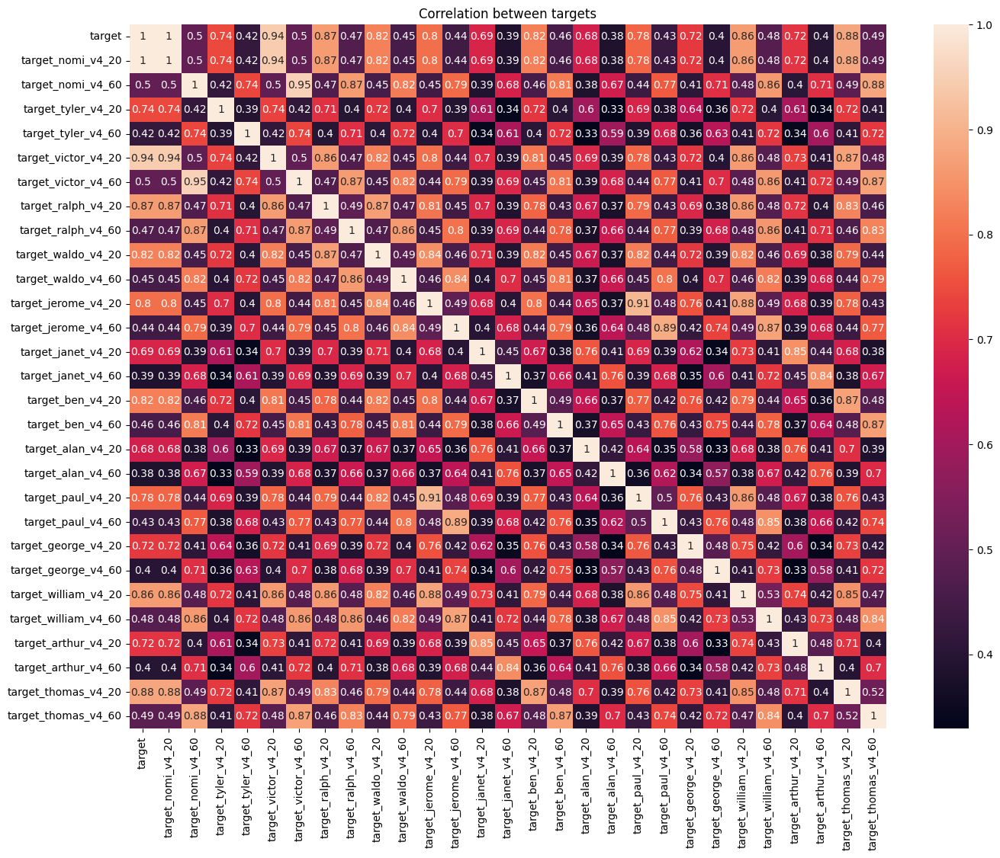

In [10]:
targets = [c for c in df_train if c.startswith("target")]
targets_corr = df_train[targets].corr()
plt.figure(figsize=(16, 12))
ax = sns.heatmap(targets_corr, annot=True)
ax.set_title("Correlation between targets")
plt.show()

The landscape of the targets. Not much information. lol

In [8]:
new_corr_matrix_all[targets].describe()

,target,target_nomi_v4_20,target_nomi_v4_60,target_tyler_v4_20,target_tyler_v4_60,target_victor_v4_20,target_victor_v4_60,target_ralph_v4_20,target_ralph_v4_60,target_waldo_v4_20,...,target_paul_v4_20,target_paul_v4_60,target_george_v4_20,target_george_v4_60,target_william_v4_20,target_william_v4_60,target_arthur_v4_20,target_arthur_v4_60,target_thomas_v4_20,target_thomas_v4_60
count,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,...,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000,1220.000000
mean,0.015595,0.015595,0.015158,0.013350,0.012990,0.014718,0.014353,0.015254,0.014894,0.015104,...,0.018206,0.019045,0.018655,0.021289,0.014948,0.013975,0.013181,0.012661,0.017861,0.018736
std,0.102500,0.102500,0.099329,0.088780,0.087028,0.102012,0.099358,0.099863,0.097486,0.099157,...,0.099257,0.097651,0.090719,0.089236,0.102425,0.100078,0.090650,0.088172,0.100364,0.097679
min,-0.027984,-0.027984,-0.046461,-0.023988,-0.039759,-0.026459,-0.045342,-0.026675,-0.044992,-0.026485,...,-0.087153,-0.112646,-0.059351,-0.093623,-0.025786,-0.042642,-0.005108,-0.005953,-0.027716,-0.045145
25%,-0.002014,-0.002014,-0.003007,-0.001993,-0.003043,-0.001208,-0.002091,-0.001576,-0.002807,-0.001942,...,-0.006713,-0.008706,-0.003504,-0.004782,-0.002495,-0.005032,-0.000755,-0.001278,-0.002013,-0.002232
50%,0.000690,0.000690,0.000474,0.000651,0.000508,-0.000072,-0.000054,0.000818,0.000613,0.000977,...,0.003071,0.003702,0.005651,0.008561,0.000613,0.000183,-0.000164,-0.000330,0.003093,0.004494
75%,0.003777,0.003777,0.004864,0.003377,0.004226,0.001231,0.002067,0.003739,0.004532,0.003913,...,0.013849,0.017666,0.016093,0.025289,0.003753,0.004933,0.000258,0.000475,0.008738,0.012396
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Get the top 25% of the features that are strongly correlated with target_60

In [8]:
#get the values in row '75%' from the table of new_corr_matrix_all
corr_all_target_mean = new_corr_matrix_all[targets].describe().iloc[6,:]

#get top 25% for each target
positive_features_v2 =[]       

for target in targets_60:
    df_corr_target = new_corr_matrix_all[['features', target]]
    filtered_df_positive = df_corr_target[df_corr_target[target] >= corr_all_target_mean[target]]
    filtered_df_positive = filtered_df_positive[filtered_df_positive['features'].str.startswith('feature') ]
    for i in filtered_df_positive['features']:
        if i not in positive_features_v2:
            positive_features_v2.append(i)
    # pos_feat = filtered_df_positive.sort_values(by='target_tyler_v4_60', ascending=False)
len(positive_features_v2)
# pos_feat.describe()

793

For curiosity, I plot the 793 features of the top 25% correlated positive feature with the target_60. It's impossible to read but beautiful.

Text(0.5, 1.0, 'Correlation of the top positive feature by era')

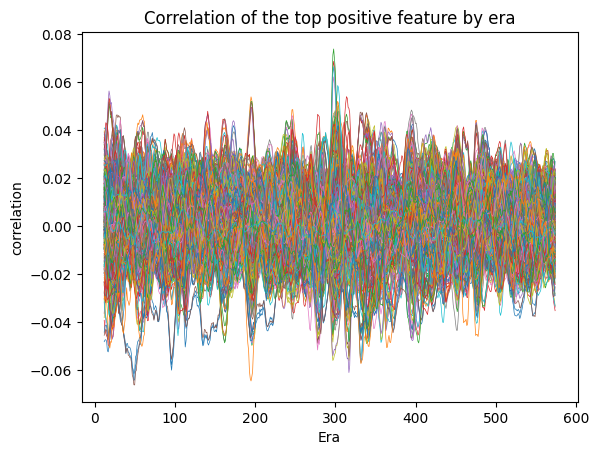

In [23]:
df_train["erano"] = df_train.era.astype(int)
for top_feature in positive_features_v2:
    
    by_era_correlation = pd.Series({
        era: np.corrcoef(tdf["target"], tdf[top_feature])[0,1]
        for era, tdf in df_train.groupby(df_train.erano)
    })
    by_era_correlation.rolling(12).mean().plot(label=top_feature, linewidth=0.5)
plt.xlabel('Era')
plt.ylabel('correlation with 60-day targets')
plt.title('Correlation of the top 25% positive feature by era')


extract all the 20-day positive and non-positive features for training

In [9]:
positive_features = [c for c in filtered_df_positive['features']]
non_positive_features = [i for i in features if i not in positive_features]
feature_len = len(positive_features)+len(non_positive_features)
print(f"total features: {feature_len}")


total features: 1191


----------

# Training time!!

to warm up, we'll train a simple linear regression using sklearn

I only split 10% of the training data for testing because the data size is very large

In [16]:
X_train = df_train[features].fillna(0.5).values
y_train = df_train.target.fillna(0.5).values
X_val = df_validation[features].fillna(0.5).values
print("size of X_train = " + str(X_train.shape))
print("size of y_train = " + str(y_train.shape))
print("size of y_val = " + str(X_val.shape))
print("size of y_live = " + str(X_live.shape))

size of X_train = (2420521, 1191)
size of y_train = (2420521,)
size of y_val = (2436823, 1191)
size of y_live = (4989, 1191)


In [16]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
reg = linear_model.LinearRegression()
reg.fit(X_train,y_train)
score = reg.score(X_test, y_test)
print(f"score: {score}")

score: 0.004201546814638024


L2 linear regression with entire dataset. Slightly better than no regularization

In [17]:
alpha = [0.1, 0.25, 0.5, 0.75, 0.9]

for i in alpha:
    reg = Ridge(alpha=0.5)
    reg.fit(X_train,y_train)
    score = reg.score(X_test, y_test)
    print(f"L2 score with alpha: {i} = {score}")

L2 score with alpha: 0.1 = 0.004201626217375187
L2 score with alpha: 0.25 = 0.004201626217375187
L2 score with alpha: 0.5 = 0.004201626217375187
L2 score with alpha: 0.75 = 0.004201626217375187
L2 score with alpha: 0.9 = 0.004201626217375187


Here's the evaluation from Numerai

| Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 0.6603 | 0.0186 | 0.0056 | 0.0282 | 0.3347 | -0.3635 | 0.1250 | 0.0107 | 0.2808 |



-------

## lightGBM
according to this paper https://arxiv.org/pdf/2207.08815.pdf, the author states that gradient boost model works better than deep learning on tabular dataset because deep learning architectures fail
to generalize to new datasets" than to create a comprehensive benchmark. So, I'll use lightGBM for the rest of the training.

NOTE: this paper focused on medium data size (50K), which might not be applicable for our dataset (2M). But, due to limited time, I will mainly focus on the feature engineering. Also, I found an article of hyper-parameters tuning for lightGBM https://neptune.ai/blog/lightgbm-parameters-guide

In [12]:
X_train = df_train[features].fillna(0.5).values
y_train = df_train.target.fillna(0.5).values
# X_live = df_live[features].fillna(0.5).values
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [8]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 2000
evals_result = {}
params = {
    'boosting_type': 'gdbt',
    'objective': 'regression',
    'metric': 'MSE',
    'early_stopping': 100,
    'learning_rate': 0.1,
    'num_threads': 32,
    'verbose': -1,
    'reg_alpha': 0.1,       # L1 regularization strength
    'reg_lambda': 0.3,      # L2 regularization strength
    'alpha': 1,             # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
}
model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=10)
joblib.dump(model, './models/v4_all_20000.pkl')


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/callback.py:223: UserWarning: Early stopping is not available in dart mode
  _log_warning('Early stopping is not available in dart mode')


[10]	train's l2: 0.0498615	test's l2: 0.0499431
[20]	train's l2: 0.049772	test's l2: 0.0498761
[30]	train's l2: 0.0497088	test's l2: 0.049832
[40]	train's l2: 0.049667	test's l2: 0.049805
[50]	train's l2: 0.0518835	test's l2: 0.0520778
[60]	train's l2: 0.0552828	test's l2: 0.055518
[70]	train's l2: 0.0545652	test's l2: 0.0548009
[80]	train's l2: 0.051382	test's l2: 0.0515964
[90]	train's l2: 0.0510024	test's l2: 0.0512109
[100]	train's l2: 0.0521201	test's l2: 0.0523515
[110]	train's l2: 0.0559576	test's l2: 0.056219
[120]	train's l2: 0.0513554	test's l2: 0.0515884
[130]	train's l2: 0.0504823	test's l2: 0.0507049
[140]	train's l2: 0.0521168	test's l2: 0.0523697
[150]	train's l2: 0.0512913	test's l2: 0.0515398
[160]	train's l2: 0.0535052	test's l2: 0.0537724
[170]	train's l2: 0.0508591	test's l2: 0.0511117
[180]	train's l2: 0.0507022	test's l2: 0.0509572
[190]	train's l2: 0.0499244	test's l2: 0.0501768
[200]	train's l2: 0.0498651	test's l2: 0.0501234
[210]	train's l2: 0.0504548	test's l

['./models/v4_all_20000.pkl']

In [9]:
joblib.dump(model, './models/v4_all_20000.pkl')

['./models/v4_all_20000.pkl']

Text(0.5, 1.0, 'learning curve')

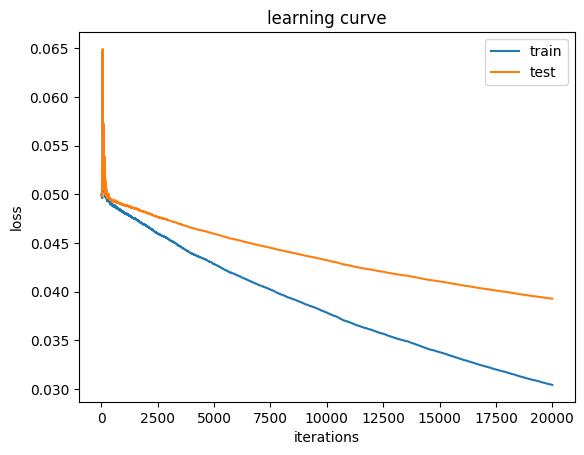

In [10]:
(pd.DataFrame({k: v['l2'] for k,v in evals_result.items()})).plot()
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('learning curve')

In [9]:
model = joblib.load('./models/v4_all_20000.pkl')

In [10]:
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"all_20000")

By using the lightGBM, the same data works very close to baseline

| Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 0.9083 | 0.0252 | 0.0183 | 0.0278 | 0.3224 | -0.1719 | 0.0997 | 0.0205 | 0.5089 |


In [16]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 2000
evals_result = {}
params = {
    'boosting_type': 'dart',
    'objective': 'regression',
    'metric': 'MSE',
    'early_stopping': 100,
    'learning_rate': 0.1,
    'num_threads': 32,
    'verbose': -1,
    'reg_alpha': 0.1,       # L1 regularization strength
    'reg_lambda': 0.3,      # L2 regularization strength
    'alpha': 1,             # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
}
model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=10)
joblib.dump(model, './models/v4_all_2000_test_dart.pkl')

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/callback.py:223: UserWarning: Early stopping is not available in dart mode
  _log_warning('Early stopping is not available in dart mode')


[10]	train's l2: 0.0498615	test's l2: 0.0499431
[20]	train's l2: 0.049772	test's l2: 0.0498761
[30]	train's l2: 0.0497088	test's l2: 0.049832
[40]	train's l2: 0.049667	test's l2: 0.049805
[50]	train's l2: 0.0518835	test's l2: 0.0520778
[60]	train's l2: 0.0552828	test's l2: 0.055518
[70]	train's l2: 0.0545652	test's l2: 0.0548009
[80]	train's l2: 0.051382	test's l2: 0.0515964
[90]	train's l2: 0.0510024	test's l2: 0.0512109
[100]	train's l2: 0.0521201	test's l2: 0.0523515
[110]	train's l2: 0.0559576	test's l2: 0.056219
[120]	train's l2: 0.0513554	test's l2: 0.0515884
[130]	train's l2: 0.0504823	test's l2: 0.0507049
[140]	train's l2: 0.0521168	test's l2: 0.0523697
[150]	train's l2: 0.0512913	test's l2: 0.0515398
[160]	train's l2: 0.0535052	test's l2: 0.0537724
[170]	train's l2: 0.0508591	test's l2: 0.0511117
[180]	train's l2: 0.0507022	test's l2: 0.0509572
[190]	train's l2: 0.0499244	test's l2: 0.0501768
[200]	train's l2: 0.0498651	test's l2: 0.0501234
[210]	train's l2: 0.0504548	test's l

['./models/v4_all_2000_test_dart.pkl']

In [18]:
model = joblib.load('./models/v4_all_2000_test_dart.pkl')

In [19]:
# X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"all_2000_test_dart")

--------

## Training on features that are positively correlated with the 20-day target

check if all the positive features are in the training set

In [32]:
# Check if a single column name is present in the DataFrame
count1 = 0
count2 = 0
found_pos_features = []
for pos_features in positive_features:
    if pos_features in df_train.columns:
        # Access the column data
        column_data = df_train[pos_features]
        found_pos_features.append(pos_features)
        count1 +=1
    else:
        count2 +=1
        # print(f"Column {pos_features} not found in DataFrame.")

print("num of features found in df_train= " + str(count1))
print("num of features not in df_train= " + str(count2))


num of features found in df_train= 667
num of features not in df_train= 0


In [33]:
X_train = df_train[positive_features].fillna(0.5).values
y_train = df_train.target.fillna(0.5).values
X_val = df_validation[positive_features].fillna(0.5).values
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [55]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 5000
evals_result = {}
params = {
    'boosting_type': 'dart',
    'objective': 'regression',
    'metric': 'MSE',
    'learning_rate': 0.1,
    # 'max_depth': 6,
    # 'num_leaves': 2^6,
    'num_threads': 32,
    'verbose': -1,
    'reg_alpha': 0.5,       # L1 regularization strength
    'reg_lambda': 0.5,      # L2 regularization strength
    'alpha': 1,             # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
}

model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=10)

[10]	train's l2: 0.0499068	test's l2: 0.0499959
[20]	train's l2: 0.0498398	test's l2: 0.0499479
[30]	train's l2: 0.0497891	test's l2: 0.0499126
[40]	train's l2: 0.0497545	test's l2: 0.0498888
[50]	train's l2: 0.0519738	test's l2: 0.0521637
[60]	train's l2: 0.0553746	test's l2: 0.0556052
[70]	train's l2: 0.0546611	test's l2: 0.054892
[80]	train's l2: 0.0514836	test's l2: 0.051688
[90]	train's l2: 0.0511025	test's l2: 0.0512993
[100]	train's l2: 0.052222	test's l2: 0.0524412
[110]	train's l2: 0.0560586	test's l2: 0.0563076
[120]	train's l2: 0.0514618	test's l2: 0.051683
[130]	train's l2: 0.0505908	test's l2: 0.0508045
[140]	train's l2: 0.0522304	test's l2: 0.0524704
[150]	train's l2: 0.0514048	test's l2: 0.0516363
[160]	train's l2: 0.0536172	test's l2: 0.0538678
[170]	train's l2: 0.0509769	test's l2: 0.0512132
[180]	train's l2: 0.0508231	test's l2: 0.0510611
[190]	train's l2: 0.0500478	test's l2: 0.0502876
[200]	train's l2: 0.0499929	test's l2: 0.050238
[210]	train's l2: 0.0505812	test's

The model is still converging. But due to limited of time, I'll only train for 5000 steps.

<AxesSubplot:>

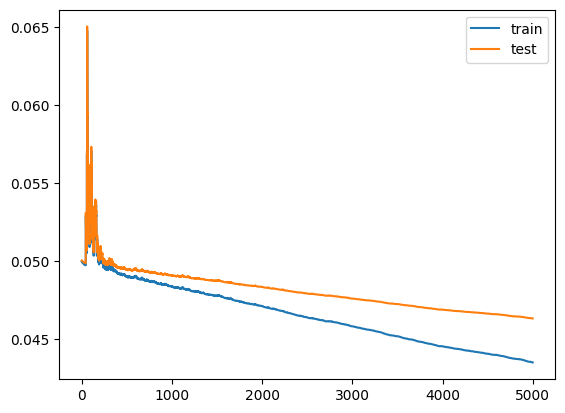

In [68]:
(pd.DataFrame({k: v['l2'] for k,v in evals_result.items()})).plot()


In [69]:
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"pos_v3b_5000")
# save model
joblib.dump(model, './models/v4_pos_v3_5000.pkl')


['./models/v4_pos_v3_5000.pkl']

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| all positive | 0.7383 | 0.0212 | 0.0155 | 0.0287 | 0.3537 | -0.2294 | 0.0429 | 0.0160 | 0.4909 |


Although, the performance of positive correlated model looks good, it's likely that the model is overfitting to the dataset becasue it was only trained by half of the total features. In the other words, it won't be good at generalization. This is also why the feature exposure is 0.572

Learn more about feature exposure: https://forum.numer.ai/t/model-diagnostics-feature-exposure/899

------

## Training using all features but assigning more weight to those that have a positive correlation with the target_20

### Try out 1: ratio between positive and non-positive features = 2:1
Assign a higher weight to positive features, with a weight ratio of 2:1 between positive and non-positive features.

In [9]:
w = 2
X_train = df_train
for col in positive_features:
    X_train[col] *= w

X_train = X_train[features].fillna(0.5).values
y_train = df_train.target.fillna(0.5).values

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [14]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 2000
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'mse',
    'learning_rate': 0.1,
    'max_depth': 5,
    'num_leaves': 2^5,
    'num_threads': 24,
    'verbose': 0,
    'max_bin': feature_len,
    'lambda_l2': 0.2,
    # 'device': 'gpu'
}

model = lgb.train(params, train_data, num_rounds, valid_sets=[valid_data])

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 5.114709 seconds.
You can set `force_col_wise=true` to remove the overhead.
[1]	valid_0's l2: 0.0500496
[2]	valid_0's l2: 0.05004
[3]	valid_0's l2: 0.0500318
[4]	valid_0's l2: 0.050024
[5]	valid_0's l2: 0.0500177
[6]	valid_0's l2: 0.0500124
[7]	valid_0's l2: 0.0500058
[8]	valid_0's l2: 0.05
[9]	valid_0's l2: 0.0499954
[10]	valid_0's l2: 0.0499909
[11]	valid_0's l2: 0.0499868
[12]	valid_0's l2: 0.0499831
[13]	valid_0's l2: 0.049979
[14]	valid_0's l2: 0.0499752
[15]	valid_0's l2: 0.0499712
[16]	valid_0's l2: 0.0499681
[17]	valid_0's l2: 0.0499645
[18]	valid_0's l2: 0.0499614
[19]	valid_0's l2: 0.0499576
[20]	valid_0's l2: 0.0499535
[21]	valid_0's l2: 0.0499511
[22]	valid_0's l2: 0.0499485
[23]	valid_0's l2: 0.049946
[24]	valid_0's l2: 0.0499433
[25]	valid_0's l2: 0.0499406
[26]	valid_0's l2: 0.049938
[27]	valid_0's l2: 0.0499355
[28]	valid_0's l2: 0.0499326
[29]	valid_0's l2: 0.0499305
[30]	valid_0's

In [15]:
# X_val = df_validation[found_pos_features].fillna(0.5).values
# X_live = df_live[features].fillna(0.5).values
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"pos_and_all_v5_2to1_2000")
# save model
joblib.dump(model, './models/v4_pos_and_all_v5_2to1_2000.pkl')
# load model
# model = joblib.load('./models/v4_pos_features_v1.pkl')


['./models/v4_pos_and_all_v5_2to1_2000.pkl']

### Try out 2: ratio between positive and non-positive features = 1:0.5
Train all features and scale down the values of the ones that exhibit a **negative** correlation with the target by a factor of 0.5.

In [17]:
w = 0.5
X_train = df_train
for col in non_positive_features:
    X_train[col] *= w

X_train = X_train[features].fillna(0.5).values
y_train = df_train.target.fillna(0.5).values
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [18]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 2000
evals_result = {}
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'mse',
    'learning_rate': 0.1,
    'max_depth': 5,
    'num_leaves': 2^5,
    'num_threads': 24,
    'verbose': 0,
    'max_bin': feature_len,
    'lambda_l2': 0.2,
    # 'device': 'gpu'
}

model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], evals_result=evals_result, verbose_eval=20)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 6.527203 seconds.
You can set `force_col_wise=true` to remove the overhead.
[1]	valid_0's l2: 0.0500507
[2]	valid_0's l2: 0.0500429
[3]	valid_0's l2: 0.0500347
[4]	valid_0's l2: 0.0500299
[5]	valid_0's l2: 0.0500251
[6]	valid_0's l2: 0.0500222
[7]	valid_0's l2: 0.0500211
[8]	valid_0's l2: 0.0500192
[9]	valid_0's l2: 0.0500166
[10]	valid_0's l2: 0.0500182
[11]	valid_0's l2: 0.0500171
[12]	valid_0's l2: 0.0500156
[13]	valid_0's l2: 0.0500152
[14]	valid_0's l2: 0.0500145
[15]	valid_0's l2: 0.0500108
[16]	valid_0's l2: 0.0500099
[17]	valid_0's l2: 0.0500068
[18]	valid_0's l2: 0.0500081
[19]	valid_0's l2: 0.0500092
[20]	valid_0's l2: 0.050009
[21]	valid_0's l2: 0.0500077
[22]	valid_0's l2: 0.0500068
[23]	valid_0's l2: 0.0500043
[24]	valid_0's l2: 0.0500063
[25]	valid_0's l2: 0.0500051
[26]	valid_0's l2: 0.0500052
[27]	valid_0's l2: 0.0500033
[28]	valid_0's l2: 0.0500019
[29]	valid_0's l2: 0.0500001
[30]

In [19]:
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"pos_and_all_v5_05to1_2000")
joblib.dump(model, './models/v4_pos_and_all_v5_05to1_2000.pkl')



['./models/v4_pos_and_all_v5_05to1_2000.pkl']

### Try out 3: ratio between positive and non-positive features = 1.15:0.85
- scale up the values of the ones that exhibit a **positive** correlation with the target by a factor of 1.15
- scale down the values of the ones that exhibit a **negative** correlation with the target by a factor of 0.85

In [10]:
w1 = 1.15
w2 = 0.85
X_train = df_train

for col in positive_features:
    X_train[col] *= w1

for col in non_positive_features:
    X_train[col] *= w2

X_train = X_train[features].fillna(0.5).values
y_train = df_train.target.fillna(0.5).values


In [11]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [ ]:
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"pos_and_all_v5_05to1_2000")
joblib.dump(model, './models/v4_pos_and_all_v5_05to1_2000.pkl')


### Performance of different wieghts
given by Numerai's evaluation metrics



| pos: neg | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 1:1 | 0.8834 | 0.0269 | 0.0219 | 0.0305 | 0.3788 | -0.2351 | 0.1289 | 0.0220 | 0.5582 |
| 2:1 | 0.6011 | 0.0152 | 0.0138 | 0.0253 | 0.5797 | -0.3044 | 0.0724 | 0.0134 | 0.3432 |
| 1.15:0.85 | 0.6897 | 0.0213 | 0.0166 | 0.0309 | 0.4705 | -0.2884 | 0.1056 | 0.0172 | 0.4558 |
| 1.25:0.75 | 0.6792 | 0.0201 | 0.0153 | 0.0296 | 0.4907 | -0.3342 | 0.1087 | 0.0156 | 0.4351 |
| 1:0.5 | 0.4165 | 0.0297 | 0.0298 | 0.0712 | 0.851 | -0.9251 | -0.0406 | 0.0296 | 0.0533 |

The assumption that including all features in the model enhances its generalizability when upscaling positive features has been proven wrong. In fact, the overall score from all feature combinations is worse than not changing the weight, for example, maintaining a 1:1 ratio of positive to non-positive features.

In general, altering the ratio of positive to non-positive features results in a significant increase in feature exposure. Scaling up positive features hardly improves the scores, while scaling down non-positive features dramatically affects the Sharpe ratio, which can drop by almost 50%. Moreover, scaling down non-positive features increases feature exposure and maximum drawdown significantly.

Simultaneously scaling up positively correlated features and scaling down negatively correlated features improves the Sharpe ratio, correlation, and maximum drawdown compared to other combinations. However, this approach still does not outperform the 1:1 ratio.

There are a few assumptions to consider:
- Adjusting the weights of features is still effective, but we need to take into account the correlation within a specific timeframe.
- Keeping the features unchanged and not modifying their weights may also be a valid option.

------

## Train on top 25% positive features
Based on the previous experiment, we conclude that training on only a few positive features performs better than training on all features. To improve generalizability, we included the top-correlated positive feature based on distribution in both the 20-day target and 60-day target. Specifically, we picked the top 25% positively correlated features.

In [ ]:
X_train = df_train[positive_features_v2].fillna(0.5).values
y_train = df_train.target.fillna(0.5).values
X_val = df_validation[positive_features_v2].fillna(0.5).values
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 16000
evals_result = {}
params = {
    'boosting_type': 'dart',
    'objective': 'regression',
    'metric': 'MSE',
    'early_stopping': 100,
    'learning_rate': 0.08,
    'num_threads': 32,
    'verbose': -1,
    'reg_alpha': 0.1,       # L1 regularization strength
    'reg_lambda': 0.3,      # L2 regularization strength
    'alpha': 1,             # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
}
model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=10)
joblib.dump(model, './models/v4_pos_v5_16000.pkl')

Text(0.5, 1.0, 'learning curve')

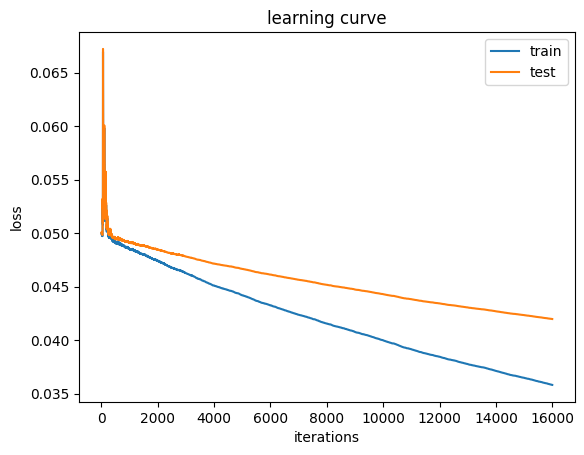

In [95]:
(pd.DataFrame({k: v['l2'] for k,v in evals_result.items()})).plot()
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('learning curve')

In [104]:

X_val =  df_validation[positive_features_v2].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"pos_v5_16000")


However, even though we included the 60-day positive features, the model still did not outperform the one that was trained only on the 20-day positive features. In general, the more features included in the model, the more likely the model will be impacted by noise.

| models | num of feat. | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| all positive (20 day) | 667 | 0.7383 | 0.0212 | 0.0155 | 0.0287 | 0.3537 | -0.2294 | 0.0429 | 0.0160 | 0.4909 |
| top 25% (20 and 60 day)| 793 | 0.7289 | 0.0203 | 0.0178 | 0.0279 | 0.5417 | -0.3212 | 0.0411 | 0.0162 | 0.4452 |


--------------------------

## Time-Series cross validation
Based on the previous experiment, we realized that the correlation needs to be considered as a time series. To address this issue, we applied time-series techniques, which involved performing multiple rounds of cross-validation. Each round consisted of an outer and an inner cross-validation loop.

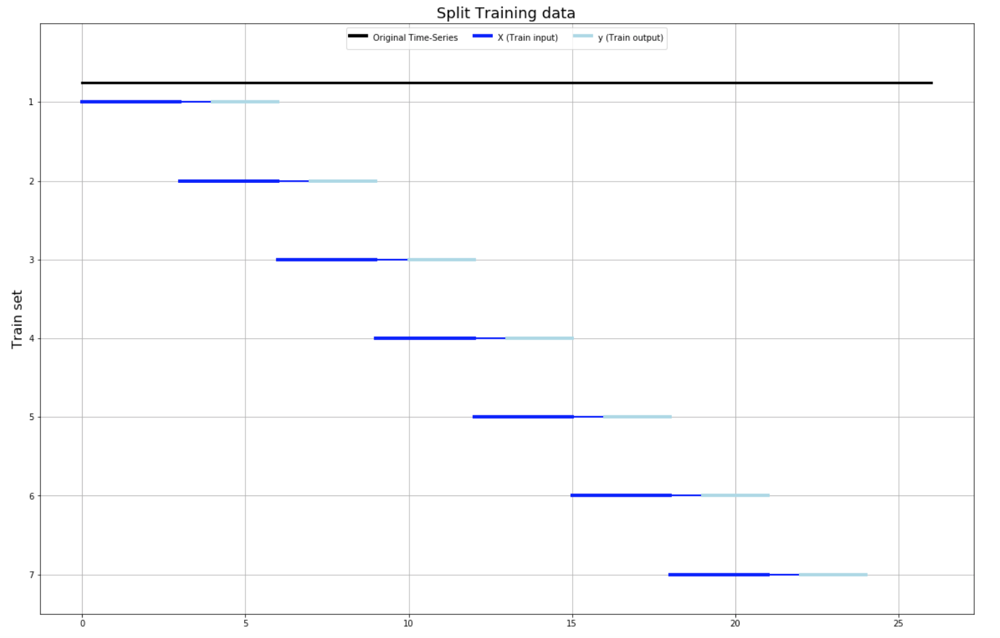

To this point, all trainings become really expensive. This has made it difficult for me to evaluate the score within limited time, as I have had to wait for the training to iterate through an entire epoch as a complete cycle.

### Try out 1: moving by single era

In [76]:
eras = df_train['era'].unique()
X_train = df_train
X_train['era'] = X_train['era'].astype(int)
X_train = X_train.groupby('era')

evals_result = {}
num_rounds = 1000
params = {
    'boosting_type': 'dart',
    'objective': 'regression',
    'metric': 'MSE',
    'learning_rate': 0.1,
    'num_threads': 32,
    'verbose': -1,
    'reg_alpha': 0.5,       # L1 regularization strength
    'reg_lambda': 0.5,      # L2 regularization strength
    'alpha': 1,             # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
}

for era, group_df in X_train:
    X_train = group_df[features].fillna(0.5).values
    y_train = group_df.target.fillna(0.5).values
    X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
    train_data = lgb.Dataset(X_train, label=y_train)
    valid_data = lgb.Dataset(X_test, label=y_test)
    print(f"era = {era}")
    if era == 1:  
        model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=num_rounds)
    else:
        model = lgb.train(params, train_data, num_rounds, init_model = model, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=num_rounds)



era = 572


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


[564000]	train's l2: 0.660217	test's l2: 4.89032
era = 573


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


[565000]	train's l2: 0.691682	test's l2: 4.92029
era = 574


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


[566000]	train's l2: 0.625252	test's l2: 4.5372


<AxesSubplot:>

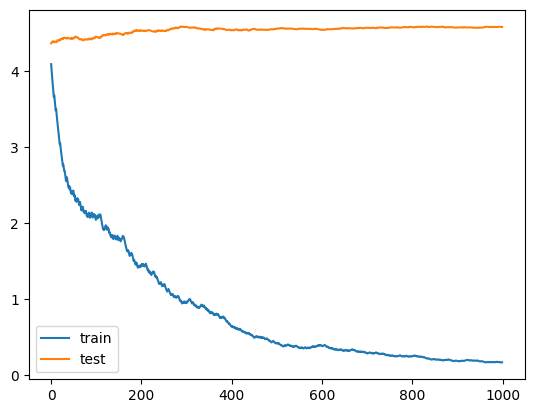

In [86]:
# for k,v in evals_result.items():
#     print(v)
(pd.DataFrame({k: v['l2'] for k,v in evals_result.items()})).plot()

In [9]:
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=100)
valid_gen_and_save(y_pred,"single_frame_1000")
joblib.dump(model, './models/v4_single_frame_1000.pkl')     # save model


Performance of moving by 1 era

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| moving by 1 era | 0.7118 | 0.0208 | 0.0165 | 0.0293 | 0.4965 | -0.3409 | 0.1193 | 0.0159 | 0.4507 |

-----

### Try out 2: moving by 20 groups

In [7]:
X_train = df_train
X_train['era'] = X_train['era'].astype(int)
eras = df_train['era'].unique()
eras_len = len(eras)

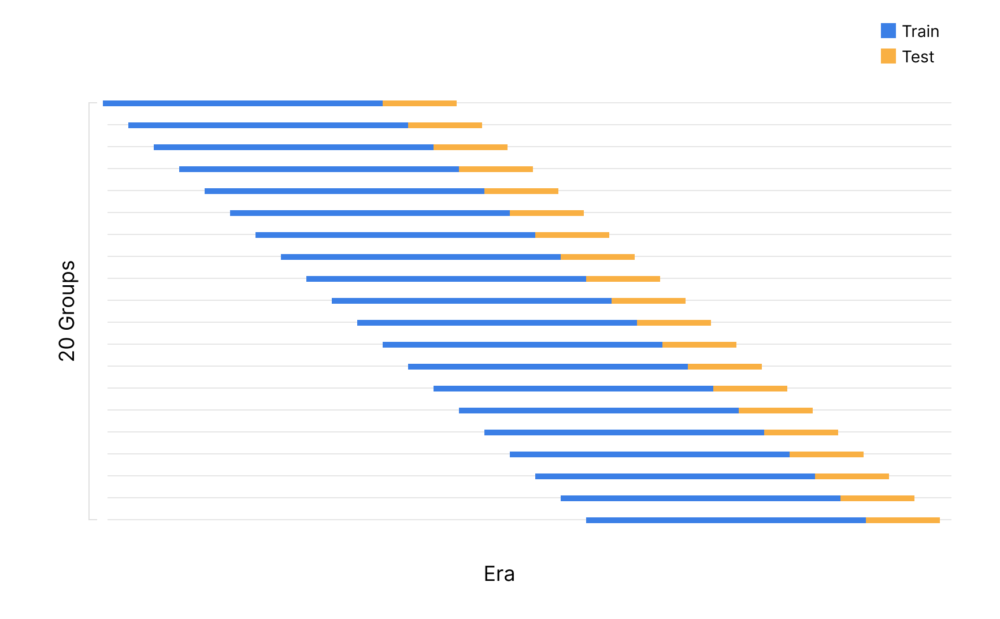

In [19]:
timeSeries = np.array([i for i in range(1,eras_len+1)])
tscv = TimeSeriesSplit(gap=2, max_train_size=None, n_splits=20, test_size=1)
lr = 0.08
evals_result = {}

for i, (train_index, test_index) in enumerate(tscv.split(timeSeries)):
    print(f"Fold {i}:")
    era = i+1
    train_index += 1
    test_index += 1
    train_index = train_index.tolist()
    test_index = test_index.tolist()

    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")
        
    mask_train = X_train['era'].isin(train_index)
    mask_val = X_train['era'].isin(test_index)

    X_era = X_train[mask_train][features].fillna(0.5).values
    y_era = X_train[mask_train].target.fillna(0.5).values
    X_test = X_train[mask_val][features].fillna(0.5).values
    y_test = X_train[mask_val].target.fillna(0.5).values
    
    num_rounds = 1000

    params = {
        'boosting_type': 'dart',
        'objective': 'regression',
        'metric': 'MSE',
        'learning_rate': lr,
        'num_threads': 32,
        'verbose': -1,
        'reg_alpha': 0.5,       # L1 regularization strength
        'reg_lambda': 0.5,      # L2 regularization strength
        'alpha': 1,             # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
    }
    train_data = lgb.Dataset(X_era, label=y_era)
    valid_data = lgb.Dataset(X_test, label=y_test)
    if era == 1:  
        model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=100)
    else:
        model = lgb.train(params, train_data, num_rounds, init_model = model, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=100)


[18600]	train's l2: 0.0356931	test's l2: 0.0501846
[18800]	train's l2: 0.0355995	test's l2: 0.0501572
[19000]	train's l2: 0.0355006	test's l2: 0.0501354
Fold 19:
  Train: index=[20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 20

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


[19200]	train's l2: 0.0354164	test's l2: 0.0502624
[19400]	train's l2: 0.0353129	test's l2: 0.0502112
[19600]	train's l2: 0.0352209	test's l2: 0.0501942
[19800]	train's l2: 0.0351303	test's l2: 0.0501298
[20000]	train's l2: 0.0350361	test's l2: 0.050039


<AxesSubplot:>

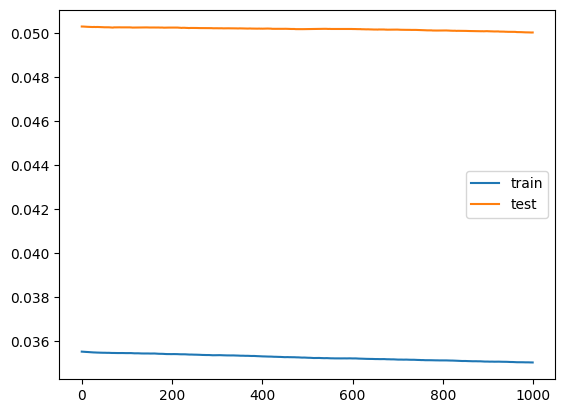

In [22]:
(pd.DataFrame({k: v['l2'] for k,v in evals_result.items()})).plot()

In [ ]:
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=100)
valid_gen_and_save(y_pred,"time_cross_val_20")
# joblib.dump(model, './models/v4_time_cross_val_20.pkl')     # save model

## split to 570 groups

In [7]:
X_train = df_train
X_train['era'] = X_train['era'].astype(int)
eras = df_train['era'].unique()
eras_len = len(eras)

In [5]:
model = joblib.load('./models/v4_kFold_570.pkl')

In [18]:
timeSeries = np.array([i for i in range(1,eras_len+1)])
tscv = TimeSeriesSplit(gap=1, max_train_size=None, n_splits=570, test_size=None)
lr = 0.05
evals_result = {}

for i, (train_index, test_index) in enumerate(tscv.split(timeSeries)):
    print(f"Fold {i}:")
    era = i+1
    train_index += 1
    test_index += 1
    train_index = train_index.tolist()
    test_index = test_index.tolist()

    print(f"  Train: index={set(train_index)}")
    print(f"  Test:  index={set(test_index)}")
        
    mask_train = X_train['era'].isin(train_index)
    mask_val = X_train['era'].isin(test_index)


    scaler = StandardScaler()

    X_era = X_train[mask_train][features].fillna(X_train[mask_train][features].mean()).values
    y_era = X_train[mask_train]['target'].fillna(0.5).values
    X_test = X_train[mask_val][features].fillna(X_train[mask_val][features].mean()).values
    y_test = X_train[mask_val]['target'].fillna(0.5).values

    X_era = scaler.fit_transform(X_era)
    X_test = scaler.transform(X_test)

    num_rounds = 50000
    params = {
        'boosting_type': 'gbdt',
        'objective': 'regression',
        'metric': 'MSE',
        'learning_rate': lr,
        'num_threads': 32,
        'early_stopping': 50,
        'verbose': -1,
    }
    train_data = lgb.Dataset(X_era, label=y_era)
    valid_data = lgb.Dataset(X_test, label=y_test)
    if era == 1:  
        model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data])
    else:
        model = lgb.train(params, train_data, num_rounds, init_model = model, valid_sets=[train_data, valid_data])
    joblib.dump(model, './models/v4_kFold_570.pkl')

Fold 0:
  Train: index={1, 2, 3}
  Test:  index={5}
[1]	training's l2: 0.0493878	valid_1's l2: 0.049863
Training until validation scores don't improve for 50 rounds
[2]	training's l2: 0.0488156	valid_1's l2: 0.0497093
[3]	training's l2: 0.0482002	valid_1's l2: 0.0495697
[4]	training's l2: 0.0476081	valid_1's l2: 0.0494911
[5]	training's l2: 0.047035	valid_1's l2: 0.0493334
[6]	training's l2: 0.046513	valid_1's l2: 0.0492039
[7]	training's l2: 0.046017	valid_1's l2: 0.0490945
[8]	training's l2: 0.045513	valid_1's l2: 0.0490348
[9]	training's l2: 0.0450001	valid_1's l2: 0.0489077
[10]	training's l2: 0.044535	valid_1's l2: 0.0488584
[11]	training's l2: 0.0441287	valid_1's l2: 0.0487817
[12]	training's l2: 0.0436687	valid_1's l2: 0.0487118
[13]	training's l2: 0.043178	valid_1's l2: 0.048628
[14]	training's l2: 0.0427682	valid_1's l2: 0.0485934
[15]	training's l2: 0.0423184	valid_1's l2: 0.0485472
[16]	training's l2: 0.0418636	valid_1's l2: 0.0484465
[17]	training's l2: 0.0414285	valid_1's 

In [10]:
# df_validation = pd.read_parquet('./v4/validation.parquet')
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=100)
valid_gen_and_save(y_pred,"v4_kFold_570")



In [11]:
del(X_val,df_validation)

As we can see, moving by large groups of 28 eras performs worse compared to smaller groups, such as groups of 1 era. Due to limited time, more tests are needed to see how different sizes of group perform.

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| moving by 1 era | 0.7118 | 0.0208 | 0.0165 | 0.0293 | 0.4965 | -0.3409 | 0.1193 | 0.0159 | 0.4507 |
| moving by 20 groups | 0.6991 | 0.0193 | 0.0153 | 0.0276 | 0.5538 | -0.3890 | 0.097 | 0.0146 | 0.4214 |

------

### Dynamic corr in each eras

The time-series cross-validation worked well, so we trained the model by moving through 4 eras to avoid feature overlapping, and dynamically scaled up the positively correlated features in each timeframe. However, due to limited time, we only ran an extensive test on 169 eras, instead of the entire 574 eras. More full train is required in the future.

In [61]:
from sklearn.model_selection import TimeSeriesSplit
eras = df_train['era'].unique()
X_val = df_validation[features].fillna(0.5).values
X = df_train
X['era'] = X['era'].astype(int)

window_gap = 4
int_model = './models/model_roll_v2.txt'
era_length = len(eras)
start_era = 60

for era in list(range(start_era,era_length+1)):

    if era+window_gap > era_length:
        window = list(range(era_length-window_gap+1, era_length+1))
    else:
        window = list(range(era, era+window_gap))

    num_rounds = 2000             #iteration
    mask = X['era'].isin(window)
    mask_stratify = (X[mask]['era'] == era)

    corr_matrix = X[mask][eras_features_and_targets].corr()
    filtered_df_positive = corr_matrix[corr_matrix['target'] > 0]
    filtered_df_features = filtered_df_positive[['target']]
    positive_features = [c for c in filtered_df_features.index]
    positive_features = [elem for elem in positive_features if not elem.startswith('target')]
    non_positive_features = [i for i in features if i not in positive_features]

    lr = 1/math.sqrt(era)
    X_era = X[mask][features]
    w1 = 1.5
    w2 = 0.8
    
    for col in positive_features:
        if X[col].isin(positive_features).any():
            X_era[col] *= w1
        
    for col in non_positive_features:
        if X[col].isin(non_positive_features).any():
            X_era[col] *= w2
        
    X_era = X_era[features].fillna(0.5).values
    y_era = X[mask].target.fillna(0.5).values
    X_train, X_test, y_train, y_test = train_test_split(X_era, y_era, test_size=0.3, stratify=mask_stratify, random_state=42)

    print(f'round era = {era}; iteration: {num_rounds}; learning rate: {lr}')
    train_data = lgb.Dataset(X_train, label=y_train)
    valid_data = lgb.Dataset(X_test, label=y_test)
    params = {
    'boosting_type': 'dart',
    'objective': 'regression',
    'metric': 'mae',
    'learning_rate': 0.05,
    'max_depth': 6,
    'num_leaves': 2^6,
    'num_threads': 24,
    'verbose': -1,
    'reg_alpha': 0.1,       # L1 regularization strength
    'reg_lambda': 0.3,      # L2 regularization strength
    'alpha': 1,           # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
    # 'device': 'gpu'
    }

    if era == 1:
        model = lgb.train(params, train_data, num_rounds, valid_sets=[valid_data])
    else:
        model = lgb.train(params, train_data, num_rounds, valid_sets=[valid_data], init_model = './models/model_roll_v3.txt')

    model.save_model('./models/model_roll_v3.txt')

    #save prediction every 10 iterations
    if era%10 ==0:
        print("saving model...")
        y_pred = model.predict(X_val, num_iteration=500)
        print(f"Next era {era+1}...")
        valid_gen_and_save(y_pred,f"time_v3_era{era}")

   

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| moving by 1 era | 0.7118 | 0.0208 | 0.0165 | 0.0293 | 0.4965 | -0.3409 | 0.1193 | 0.0159 | 0.4507 |
| moving by 4 era with corr in each timeframe | 0.7189 | 0.0209 | 0.0177 | 0.0290 | 0.5255 | -0.3107 | 0.1126 | 0.0163 | 0.4388 |
| moving by 20 groups | 0.6991 | 0.0193 | 0.0153 | 0.0276 | 0.5538 | -0.3890 | 0.097 | 0.0146 | 0.4214 |

------

# Fine tuning

After conducting all the tests mentioned above, we selected the best performing model based on static and dynamic timeframe of cross-validation, which corresponded to using 'all features' and 'moving by 1 era'. We then fine-tuned this model with the 60-day target: 'target_nomi_v4_60', in order to further improve its performance.

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| all feature | 0.7874 | 0.0228 | 0.0197 | 0.0289 | 0.5276 | -0.2805 | 0.1079 | 0.0184 | 0.4778 |
| all positive | 0.7383 | 0.0212 | 0.0155 | 0.0287 | 0.3537 | -0.2294 | 0.0429 | 0.0160 | 0.4909 |
| top 25% | 0.7289 | 0.0203 | 0.0178 | 0.0279 | 0.5417 | -0.3212 | 0.0411 | 0.0162 | 0.4452 |
| moving by 1 era | 0.7118 | 0.0208 | 0.0165 | 0.0293 | 0.4965 | -0.3409 | 0.1193 | 0.0159 | 0.4507 |
| moving by 4 era | 0.7189 | 0.0209 | 0.0177 | 0.029. | 0.5255 | -0.3107 | 0.1126 | 0.0163 | 0.4388 |
| time cross 20fold | 0.6991 | 0.0193 | 0.0153 | 0.0276 | 0.5538 | -0.3890 | 0.097 | 0.0146 | 0.4214 |
| sklearn linear all features | 0.6603 | 0.0186 | 0.0056 | 0.0282 | 0.3347 | -0.3635 | 0.1250 | 0.0107 | 0.2808 |

## Fune-tune 'moving by 1 era'

In [6]:
X_train = df_train[features].fillna(0.5).values
y_train = df_train['target_nomi_v4_60'].fillna(0.5).values
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [12]:
model = joblib.load('./models/v4_single_frame_1000.pkl')
evals_result={}
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 5000
params = {
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': 'mse',
    'learning_rate': 0.08,
    'num_threads': 32,
    'verbose': 0,
    'lambda_l2': 0.2,
    'early_stopping': 100
}

model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=100)
joblib.dump(model, 'v4_single_frame_1000_val_60.pkl')

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 7.760833 seconds.
You can set `force_col_wise=true` to remove the overhead.
Training until validation scores don't improve for 100 rounds
[100]	train's l2: 0.0485719	test's l2: 0.0485235
[200]	train's l2: 0.0476219	test's l2: 0.0477481
[300]	train's l2: 0.0467626	test's l2: 0.0470579
[400]	train's l2: 0.0459694	test's l2: 0.0464209
[500]	train's l2: 0.0452237	test's l2: 0.0458272
[600]	train's l2: 0.0445048	test's l2: 0.0452494
[700]	train's l2: 0.0438346	test's l2: 0.0447141
[800]	train's l2: 0.0431782	test's l2: 0.044175
[900]	train's l2: 0.042556	test's l2: 0.0436704
[1000]	train's l2: 0.0419519	test's l2: 0.0431766
[1100]	train's l2: 0.0413638	test's l2: 0.0426948
[1200]	train's l2: 0.0408026	test's l2: 0.042248
[1300]	train's l2: 0.04025	test's l2: 0.0418075
[1400]	train's l2: 0.0397309	test's l2: 0.0413885
[1500]	train's l2: 0.0392296	test's l2: 0.0409808
[1600]	train's l2: 0.0387297	test's l

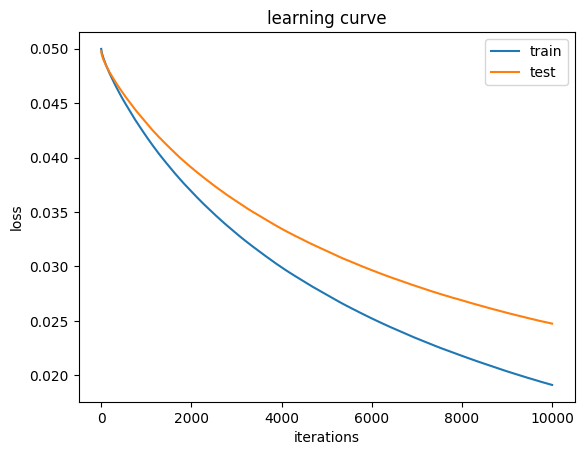

In [13]:
(pd.DataFrame({k: v['l2'] for k,v in evals_result.items()})).plot()
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('learning curve')
plt.show()

In [16]:
X_val = df_validation[features].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"v4_single_frame_1000_val_60_r3")

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| moving by 1 era fine-tuned r1 | 0.822 | 0.0251 | 0.0179 | 0.0305 | 0.3755 | -0.2444 | 0.1383 | 0.0197 | 0.4749 |
| moving by 1 era fine-tuned r2 | 0.812 | 0.0244 | 0.0179 | 0.0300 | 0.4261 | -0.2328 | 0.0666 | 0.0189 | 0.4862 |

-----

## Fine-tune Top 25% positive features

In [35]:
X_train = df_train[positive_features_v2].fillna(0.5).values
y_train = df_train['target_alan_v4_60'].fillna(0.5).values
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [36]:
model = joblib.load('./models/v4_pos_v5_16000.pkl')
evals_result={}
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test)
num_rounds = 10000
params = {
    'boosting_type': 'dart',
    'objective': 'regression',
    'metric': 'mae',
    'learning_rate': 0.05,
    'max_depth': 6,
    'num_leaves': 2^6,
    'num_threads': 24,
    'verbose': -1,
    'reg_alpha': 0.1,       # L1 regularization strength
    'reg_lambda': 0.3,      # L2 regularization strength
    'alpha': 1,           # Elastic Net mixing parameter (alpha = reg_alpha / reg_lambda)
}


In [37]:
model = lgb.train(params, train_data, num_rounds, valid_sets=[train_data, valid_data], valid_names=['train', 'test'], evals_result=evals_result, verbose_eval=100)
joblib.dump(model, './models/v4_pos_v5_16000_r3.pkl')

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


[100]	train's l1: 0.190702	test's l1: 0.190827
[200]	train's l1: 0.168535	test's l1: 0.16864
[300]	train's l1: 0.154874	test's l1: 0.154968
[400]	train's l1: 0.146045	test's l1: 0.146131
[500]	train's l1: 0.144987	test's l1: 0.145073
[600]	train's l1: 0.148991	test's l1: 0.149083
[700]	train's l1: 0.145368	test's l1: 0.145459
[800]	train's l1: 0.145875	test's l1: 0.145968
[900]	train's l1: 0.144047	test's l1: 0.14414
[1000]	train's l1: 0.143494	test's l1: 0.143587
[1100]	train's l1: 0.144026	test's l1: 0.144121
[1200]	train's l1: 0.144102	test's l1: 0.144197
[1300]	train's l1: 0.142875	test's l1: 0.142972
[1400]	train's l1: 0.141252	test's l1: 0.141351
[1500]	train's l1: 0.142815	test's l1: 0.142919
[1600]	train's l1: 0.140486	test's l1: 0.140591
[1700]	train's l1: 0.140668	test's l1: 0.140774
[1800]	train's l1: 0.141932	test's l1: 0.142041
[1900]	train's l1: 0.140773	test's l1: 0.140884
[2000]	train's l1: 0.141024	test's l1: 0.141137
[2100]	train's l1: 0.140224	test's l1: 0.140336
[22

['./models/v4_pos_v5_16000_r3.pkl']

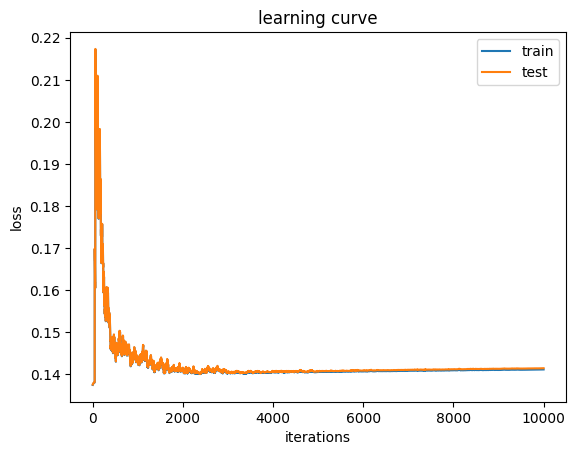

In [39]:
(pd.DataFrame({k: v['l1'] for k,v in evals_result.items()})).plot()
plt.xlabel('iterations')
plt.ylabel('loss')
plt.title('learning curve')
plt.show()

In [40]:
X_val = df_validation[positive_features_v2].fillna(0.5).values
y_pred = model.predict(X_val, num_iteration=500)
valid_gen_and_save(y_pred,"v4_pos_v5_16000_r3")

------

# Evaluation

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| official example - basic | 0.9755 | 0.0263 | 0.0232 | 0.0270 | 0.1827 | -0.1894 | 0.0918 | 0.0233 | 0.6439 |
| official example - advance | 1.0234 | 0.0278 | 0.0235 | 0.0271 | 0.2056 | -0.1299 | 0.0814 | 0.0241 | 0.6171 |
| all feature | 0.7874 | 0.0228 | 0.0197 | 0.0289 | 0.5276 | -0.2805 | 0.1079 | 0.0184 | 0.4778 |
| moving by 1 era fine-tuned r1 | 0.822 | 0.0251 | 0.0179 | 0.0305 | 0.3755 | -0.2444 | 0.1383 | 0.0197 | 0.4749 |
| all positive | 0.7383 | 0.0212 | 0.0155 | 0.0287 | 0.3537 | -0.2294 | 0.0429 | 0.0160 | 0.4909 |
| top 25% | 0.7289 | 0.0203 | 0.0178 | 0.0279 | 0.5417 | -0.3212 | 0.0411 | 0.0162 | 0.4452 |
| moving by 1 era | 0.7118 | 0.0208 | 0.0165 | 0.0293 | 0.4965 | -0.3409 | 0.1193 | 0.0159 | 0.4507 |
| moving by 4 era | 0.7189 | 0.0209 | 0.0177 | 0.029. | 0.5255 | -0.3107 | 0.1126 | 0.0163 | 0.4388 |
| time cross 20fold | 0.6991 | 0.0193 | 0.0153 | 0.0276 | 0.5538 | -0.3890 | 0.097 | 0.0146 | 0.4214 |
| sklearn linear all features | 0.6603 | 0.0186 | 0.0056 | 0.0282 | 0.3347 | -0.3635 | 0.1250 | 0.0107 | 0.2808 |

Time-series cross validation

| models | Sharpe Ratio | CORR | FNCv3 | Std. Dev. | Feat. Exposure | Max Drawdown | Autocorr | FNC | Ex. Preds Corr |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| split in 20 groups | 0.6509 | 0.0171 | 0.0134 | 0.0262 | 0.6066 | -0.3603 | 0.0857 | 0.0127 | 0.3727 |
| moving by 4 | 0.0641 | 0.0022 | 0.0005 | 0.0344 | 0.2055 | -1.0240 | 0.0416 | -0.0002 | 0.1128 |